# Imports

In [ ]:
from IPython.display import clear_output

In [ ]:
import numpy as np
import pandas as pd
from IPython.display import display
import torch
import torch.nn as nn
import torchvision.models as models
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from sklearn.model_selection import train_test_split

In [ ]:
import IPython.display as display
%cd /content/
%pip install -U openmim
!mim install "mmengine>=0.7.0"
!mim install "mmcv>=2.0.0rc4"

# Install mmdetection
!rm -rf mmdetection
!git clone https://github.com/open-mmlab/mmdetection.git
%cd mmdetection

%pip install -e .
display.clear_output()

In [ ]:
!pip install kaggle

In [ ]:
# Check Pytorch installation
import torch, torchvision
print("torch version:",torch.__version__, "cuda:",torch.cuda.is_available())

# Check MMDetection installation
import mmdet
print("mmdetection:",mmdet.__version__)

# Check mmcv installation
import mmcv
print("mmcv:",mmcv.__version__)

# Check mmengine installation
import mmengine
print("mmengine:",mmengine.__version__)

torch version: 2.0.1+cu118 cuda: True
mmdetection: 3.1.0
mmcv: 2.0.1
mmengine: 0.8.4


In [ ]:
!python --version

Python 3.10.12


# Data Setup

In [ ]:
from google.colab import files, drive
from os import path, listdir

kaggle_token_file = 'kaggle.json'
if not path.exists(kaggle_token_file):
  files.upload()

kaggle_direcotry = '~/.kaggle/'
if not path.exists(kaggle_direcotry):
  !mkdir -p {kaggle_direcotry}
  !cp kaggle.json {kaggle_direcotry}
  !chmod 600 {kaggle_direcotry}kaggle.json

dataset_zipped_file = '/content/sartorius-cell-instance-segmentation.zip'
if not path.exists(dataset_zipped_file):
  !kaggle competitions download -c sartorius-cell-instance-segmentation

!unzip '/content/sartorius-cell-instance-segmentation.zip' -d {'/dataset'}


Streaming output truncated to the last 5000 lines.
  inflating: /dataset/LIVECell_dataset_2021/images/livecell_train_val_images/Huh7/Huh7_Phase_A11_2_02d00h00m_4.tif  
  inflating: /dataset/LIVECell_dataset_2021/images/livecell_train_val_images/Huh7/Huh7_Phase_A11_2_02d04h00m_1.tif  
  inflating: /dataset/LIVECell_dataset_2021/images/livecell_train_val_images/Huh7/Huh7_Phase_A11_2_02d04h00m_2.tif  
  inflating: /dataset/LIVECell_dataset_2021/images/livecell_train_val_images/Huh7/Huh7_Phase_A11_2_02d04h00m_3.tif  
  inflating: /dataset/LIVECell_dataset_2021/images/livecell_train_val_images/Huh7/Huh7_Phase_A11_2_02d04h00m_4.tif  
  inflating: /dataset/LIVECell_dataset_2021/images/livecell_train_val_images/Huh7/Huh7_Phase_A11_2_02d08h00m_1.tif  
  inflating: /dataset/LIVECell_dataset_2021/images/livecell_train_val_images/Huh7/Huh7_Phase_A11_2_02d08h00m_2.tif  
  inflating: /dataset/LIVECell_dataset_2021/images/livecell_train_val_images/Huh7/Huh7_Phase_A11_2_02d08h00m_3.tif  
  inflating: 

In [ ]:
trian_dir = "/dataset/train"
train_csv_dir = "/dataset/train.csv"

In [ ]:
import pandas as pd
train_data = pd.read_csv(train_csv_dir)

In [ ]:
ids = list(train_data.id.unique())
class_labels = list(train_data.cell_type.unique())
class_to_number = {label:idx for idx, label in enumerate(class_labels)}
print("Class Dictionary:", class_to_number)
print(f"Number of Images: {len(ids)}")

Class Dictionary: {'shsy5y': 0, 'astro': 1, 'cort': 2}
Number of Images: 606


In [ ]:
display(train_data)

,id,annotation,width,height,cell_type,plate_time,sample_date,sample_id,elapsed_timedelta
0,0030fd0e6378,118145 6 118849 7 119553 8 120257 8 120961 9 1...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_E10-4_Vessel-714_Ph_3,0 days 11:30:00
1,0030fd0e6378,189036 1 189739 3 190441 6 191144 7 191848 8 1...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_E10-4_Vessel-714_Ph_3,0 days 11:30:00
2,0030fd0e6378,173567 3 174270 5 174974 5 175678 6 176382 7 1...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_E10-4_Vessel-714_Ph_3,0 days 11:30:00
3,0030fd0e6378,196723 4 197427 6 198130 7 198834 8 199538 8 2...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_E10-4_Vessel-714_Ph_3,0 days 11:30:00
4,0030fd0e6378,167818 3 168522 5 169225 7 169928 8 170632 9 1...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_E10-4_Vessel-714_Ph_3,0 days 11:30:00
...,...,...,...,...,...,...,...,...,...
73580,ffdb3cc02eef,3610 3 4311 7 5014 9 5717 11 6420 13 7123 15 7...,704,520,cort,11h59m00s,2020-11-01,cort[debris]_D9-3_Vessel-384_Ph_4,0 days 11:59:00
73581,ffdb3cc02eef,341585 2 342287 5 342988 10 343690 13 344394 1...,704,520,cort,11h59m00s,2020-11-01,cort[debris]_D9-3_Vessel-384_Ph_4,0 days 11:59:00
73582,ffdb3cc02eef,47788 3 48490 7 49192 11 49896 13 50599 14 513...,704,520,cort,11h59m00s,2020-11-01,cort[debris]_D9-3_Vessel-384_Ph_4,0 days 11:59:00
73583,ffdb3cc02eef,333290 1 333993 2 334696 4 335399 5 336102 6 3...,704,520,cort,11h59m00s,2020-11-01,cort[debris]_D9-3_Vessel-384_Ph_4,0 days 11:59:00


In [ ]:
def rle2mask(rle, img_w, img_h):

    ## transforming the string into an array of shape (2, N)
    array = np.fromiter(rle.split(), dtype = np.uint)
    array = array.reshape((-1,2)).T
    array[0] = array[0] - 1

    ## decompressing the rle encoding (ie, turning [3, 1, 10, 2] into [3, 4, 10, 11, 12])
    # for faster mask construction
    starts, lenghts = array
    mask_decompressed = np.concatenate([np.arange(s, s + l, dtype = np.uint) for s, l in zip(starts, lenghts)])

    ## Building the binary mask
    msk_img = np.zeros(img_w * img_h, dtype = np.uint8)
    msk_img[mask_decompressed] = 1
    msk_img = msk_img.reshape((img_h, img_w))
    msk_img = np.asfortranarray(msk_img) ## This is important so pycocotools can handle this object

    return msk_img


In [ ]:
from pycocotools import mask as maskUtils
from joblib import Parallel, delayed

def annotate(idx, row, cat_ids):
    mask = rle2mask(row['annotation'], row['width'], row['height']) # Binary mask
    c_rle = maskUtils.encode(mask) # Encoding it back to rle (coco format)
    c_rle['counts'] = c_rle['counts'].decode('utf-8') # converting from binary to utf-8
    area = maskUtils.area(c_rle).item() # calculating the area
    bbox = maskUtils.toBbox(c_rle).astype(int).tolist() # calculating the bboxes
    annotation = {
        'segmentation': c_rle,
        'bbox': bbox,
        'area': area,
        'image_id': row['id'],
        'category_id': cat_ids[row['cell_type']],
        'iscrowd': 0,
        'id': idx
    }
    return annotation

def coco_structure(df, workers=4):

    cats = [{'name': 'shsy5y', 'id': 1},
            {'name': 'astro', 'id': 2},
            {'name': 'cort', 'id': 3}]
    cat_ids = {"shsy5y": 1, "astro": 2, "cort": 3}

    images = [{'id': id, 'width': row.width, 'height': row.height, 'file_name': f'train/{id}.png'} for id, row in df.groupby('id').agg('first').iterrows()]

    # Building the annotations
    annotations = Parallel(n_jobs=workers)(delayed(annotate)(idx, row, cat_ids) for idx, row in df.iterrows())

    return {'categories': cats, 'images': images, 'annotations': annotations}


## Split into Train - Validation - Test

In [ ]:
test_ratio = 0.009
validation_ratio = 0.035
#test_ratio = 0.9
#validation_ratio = 0.8


image_groups = train_data.groupby('id')

# Split images into training and testing sets
train_image_ids, test_image_ids = train_test_split(train_data['id'].unique(), test_size=test_ratio,
                                                   stratify=train_data.groupby('id')['cell_type'].first()
                                                   ,random_state=42)

# Collect instance information for training and testing sets
train_instances = image_groups.filter(lambda x: x['id'].iloc[0] in train_image_ids)
test_instances = image_groups.filter(lambda x: x['id'].iloc[0] in test_image_ids)


# Split images into training and testing sets
train_image_ids, val_image_ids = train_test_split(train_instances['id'].unique(), test_size=validation_ratio,
                                                  stratify=train_instances.groupby('id')['cell_type'].first(),
                                                  random_state=42)

# Collect instance information for training and testing sets
train_instances = image_groups.filter(lambda x: x['id'].iloc[0] in train_image_ids)
val_instances = image_groups.filter(lambda x: x['id'].iloc[0] in val_image_ids)

# Now you have the training and testing instance information ready to use for modeling
print("Train Instances:\n", train_instances.shape)
print("Test Instances:\n", test_instances.shape)
print(train_instances['id'].unique().shape)
print(test_instances['id'].unique().shape)
print(val_instances['id'].unique().shape)

Train Instances:
 (69962, 9)
Test Instances:
 (542, 9)
(578,)
(6,)
(22,)


In [ ]:
root_train = coco_structure(train_instances)
root_test = coco_structure(test_instances)
root_val = coco_structure(val_instances)


In [ ]:
import json
with open('/dataset/annotations_train.json', 'w', encoding='utf-8') as f:
    json.dump(root_train, f, ensure_ascii=True, indent=4)
with open('/dataset/annotations_val.json', 'w', encoding='utf-8') as f:
    json.dump(root_val, f, ensure_ascii=True, indent=4)
with open('/dataset/annotations_test.json', 'w', encoding='utf-8') as f:
    json.dump(root_test, f, ensure_ascii=True, indent=4)


In [ ]:
with open('annotations_train.json', 'w', encoding='utf-8') as f:
    json.dump(root_train, f, ensure_ascii=True, indent=4)
with open('annotations_val.json', 'w', encoding='utf-8') as f:
    json.dump(root_val, f, ensure_ascii=True, indent=4)
with open('annotations_test.json', 'w', encoding='utf-8') as f:
    json.dump(root_test, f, ensure_ascii=True, indent=4)


In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


# Model Training
hhh.py isthe configuration file

In [ ]:
!python /content/mmdetection/tools/train.py /content/drive/MyDrive/hhh.py

09/12 23:33:02 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: linux
    Python: 3.10.12 (main, Jun 11 2023, 05:26:28) [GCC 11.4.0]
    CUDA available: True
    numpy_random_seed: 1627833873
    GPU 0: Tesla T4
    CUDA_HOME: /usr/local/cuda
    NVCC: Cuda compilation tools, release 11.8, V11.8.89
    GCC: x86_64-linux-gnu-gcc (Ubuntu 11.4.0-1ubuntu1~22.04) 11.4.0
    PyTorch: 2.0.1+cu118
    PyTorch compiling details: PyTorch built with:
  - GCC 9.3
  - C++ Version: 201703
  - Intel(R) oneAPI Math Kernel Library Version 2022.2-Product Build 20220804 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v2.7.3 (Git Hash 6dbeffbae1f23cbbeae17adb7b5b13f1f37c080e)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - LAPACK is enabled (usually provided by MKL)
  - NNPACK is enabled
  - CPU capability usage: AVX2
  - CUDA Runtime 11.8
  - NVCC architecture flags: -gencode;arch=compute_37,code=sm_37;-gencode;arch=compute_5

In [ ]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import tensorflow as tf
import datetime, os

In [ ]:
%tensorboard --logdir=/content/drive/MyDrive/work_dirs --port=7999

<IPython.core.display.Javascript object>

# Model Testing

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon
from pycocotools.coco import COCO
from collections import Counter
from pycocotools import mask as coco_mask

# Path to the COCO annotation file
annotation_file = '/dataset/annotations_test.json'

# Initialize COCO instance
coco = COCO(annotation_file)
image_ids = coco.getImgIds()

loading annotations into memory...
Done (t=0.02s)
creating index...
index created!


In [ ]:
!rm -r /content/out
!python3 /content/mmdetection/tools/test.py {'/content/drive/MyDrive/hhh.py'} {'/content/drive/MyDrive/work_dirs/epoch_10.pth'} --cfg-options test_evaluator.classwise=True --out /content/out/result.pkl

09/12 00:31:56 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: linux
    Python: 3.10.12 (main, Jun 11 2023, 05:26:28) [GCC 11.4.0]
    CUDA available: True
    numpy_random_seed: 1166773321
    GPU 0: Tesla T4
    CUDA_HOME: /usr/local/cuda
    NVCC: Cuda compilation tools, release 11.8, V11.8.89
    GCC: x86_64-linux-gnu-gcc (Ubuntu 11.4.0-1ubuntu1~22.04) 11.4.0
    PyTorch: 2.0.1+cu118
    PyTorch compiling details: PyTorch built with:
  - GCC 9.3
  - C++ Version: 201703
  - Intel(R) oneAPI Math Kernel Library Version 2022.2-Product Build 20220804 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v2.7.3 (Git Hash 6dbeffbae1f23cbbeae17adb7b5b13f1f37c080e)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - LAPACK is enabled (usually provided by MKL)
  - NNPACK is enabled
  - CPU capability usage: AVX2
  - CUDA Runtime 11.8
  - NVCC architecture flags: -gencode;arch=compute_37,code=sm_37;-gencode;arch=compute_5

In [ ]:
!python /content/mmdetection/tools/analysis_tools/analyze_results.py {'/content/drive/MyDrive/hhh.py'} /content/out/result.pkl /content/out/

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
09/12 00:52:12 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: linux
    Python: 3.10.12 (main, Jun 11 2023, 05:26:28) [GCC 11.4.0]
    CUDA available: True
    numpy_random_seed: 395448970
    GPU 0: Tesla T4
    CUDA_HOME: /usr/local/cuda
    NVCC: Cuda compilation tools, release 11.8, V11.8.89
    GCC: x86_64-linux-gnu-gcc (Ubuntu 11.4.0-1ubuntu1~22.04) 11.4.0
    PyTorch: 2.0.1+cu118
    PyTorch compiling details: PyTorch built with:
  - GCC 9.3
  - C++ Version: 201703
  - Intel(R) oneAPI Math Kernel Library Version 2022.2-Product Build 20220804 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v2.7.3 (Git Hash 6dbeffbae1f23cbbeae17adb7b5b13f1f37c080e)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - LAPACK is enabled (usually provided by MKL)
  - NNPACK is enabled
  - CPU capability usage: AVX2
  - CUDA Runtime 11.8
  - NV

# Result Visualization

In [ ]:
import mmcv
import mmengine
from mmdet.apis import init_detector, inference_detector


model = init_detector('/content/drive/MyDrive/hhh.py', '/content/drive/MyDrive/work_dirs/epoch_15.pth', device='cuda:0')  # or device='cuda:0'

Loads checkpoint by local backend from path: /content/drive/MyDrive/work_dirs/epoch_15.pth


In [ ]:
from mmdet.registry import VISUALIZERS
def predict_image(path : str):
  image = mmcv.imread(path)
  result = inference_detector(model, image)
  # init visualizer(run the block only once in jupyter notebook)
  visualizer = VISUALIZERS.build(model.cfg.visualizer)
  # the dataset_meta is loaded from the checkpoint and
  # then pass to the model in init_detector
  visualizer.dataset_meta = model.dataset_meta
  # show the results
  visualizer.add_datasample(
      'result',
      image,
      data_sample=result,
      draw_gt = None,
      wait_time=0,
  )
  return visualizer.get_image()

In [ ]:
import cv2  # OpenCV for image manipulation
import matplotlib.patches as patches

def plot_examples(images):
    image_ids = [x["id"] for x in images]
    # Loop through images
    for idx, image_id in enumerate(image_ids):
        image_info = coco.loadImgs([image_id])[0]
        image_path = '/dataset/' + image_info['file_name']  # Replace with your image path
        image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)  # Read as grayscale
        # Convert grayscale image to three-channel RGB
        rgb_image = cv2.cvtColor(image, cv2.COLOR_GRAY2RGB)

        # Load annotations for this image
        annotation_ids = coco.getAnnIds(imgIds=[image_id])
        annotations = coco.loadAnns(annotation_ids)

        # Create figure and axes
        fig, ax = plt.subplots(1, 2, figsize=(20, 6))

        name = ""
        combined_mask = np.zeros_like(rgb_image, dtype=np.uint8)  # Create an empty mask with the same shape as the image

        for annotation in annotations:
            rle = annotation['segmentation']
            mask = maskUtils.decode(rle)

            # Create a three-channel mask with blue intensity (255 for blue, 0 for red and green)
            colored_mask = np.zeros_like(rgb_image, dtype=np.uint8)
            colored_mask[:, :, 0] = mask * 255  # Blue channel

            # Add the colored mask to the combined mask
            combined_mask += colored_mask

            # Get bounding box coordinates
            bbox = annotation['bbox']
            x, y, width, height = bbox

            rect = patches.Rectangle((x, y), width, height, linewidth=1, edgecolor='r', facecolor='none')
            ax[0].add_patch(rect)

            category_id = annotation['category_id']
            category_info = coco.loadCats(category_id)[0]
            category_name = category_info['name']
            name = category_name

        # Combine the colored mask with the RGB image
        rgb_image_with_mask = cv2.addWeighted(rgb_image, 1, combined_mask, 0.5, 0)

        ax[0].imshow(rgb_image_with_mask)
        ax[0].set_title('ground truth')
        ax[0].axis('off')

        print(f'score : {images[idx]["score"]}, name : {name}, id : {image_id}')
        ax[1].imshow(predict_image(image_path), cmap="gray")
        ax[1].set_title('prediction')
        ax[1].axis('off')
        plt.tight_layout()
        plt.axis('off')
        plt.show()


In [ ]:
import os
import re
def get_top(s : str, reverse = False):
  pattern = r"(^[A-za-z0-9]+)_([0-9].[0-9]+)"
  l = os.listdir(f"/content/out/{s}")
  arr = []
  for elem in l:
    matches = re.findall(pattern, elem)
    arr.append({"id" : matches[0][0], "score" : matches[0][1],"path" :  f"/content/out/{s}/" + elem})

  arr = sorted(arr, key = lambda x : x["score"], reverse = reverse)
  return arr

score : 0.473, name : cort, id : 34e41956f993


/usr/local/lib/python3.10/dist-packages/mmengine/visualization/visualizer.py:196: UserWarning: Failed to add <class 'mmengine.visualization.vis_backend.TensorboardVisBackend'>, please provide the `save_dir` argument.
  warnings.warn(f'Failed to add {vis_backend.__class__}, '
/usr/local/lib/python3.10/dist-packages/mmengine/visualization/visualizer.py:196: UserWarning: Failed to add <class 'mmengine.visualization.vis_backend.LocalVisBackend'>, please provide the `save_dir` argument.
  warnings.warn(f'Failed to add {vis_backend.__class__}, '


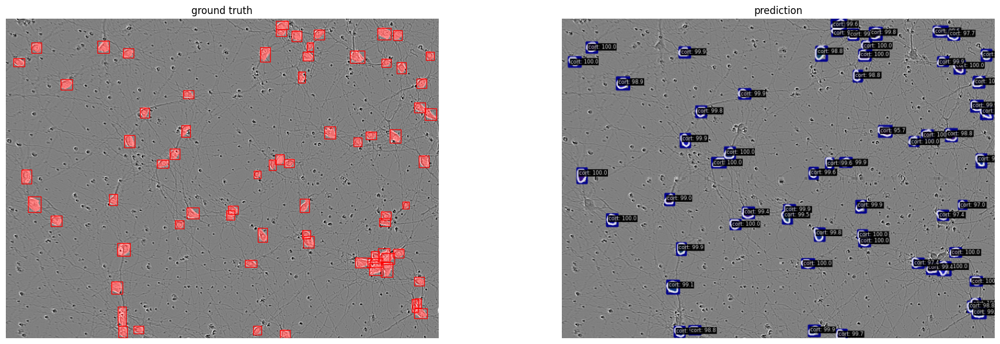

score : 0.275, name : cort, id : af54fcc34740


/usr/local/lib/python3.10/dist-packages/mmengine/utils/manager.py:113: UserWarning: <class 'mmdet.visualization.local_visualizer.DetLocalVisualizer'> instance named of visualizer has been created, the method `get_instance` should not accept any other arguments
  warnings.warn(


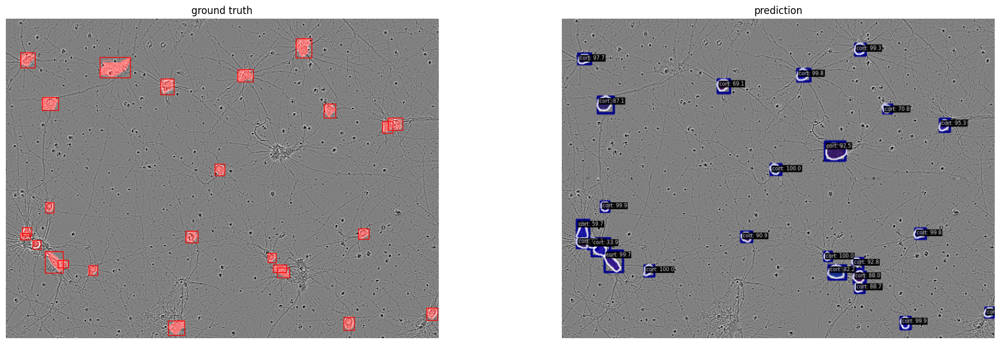

score : 0.113, name : shsy5y, id : 2025512a5956


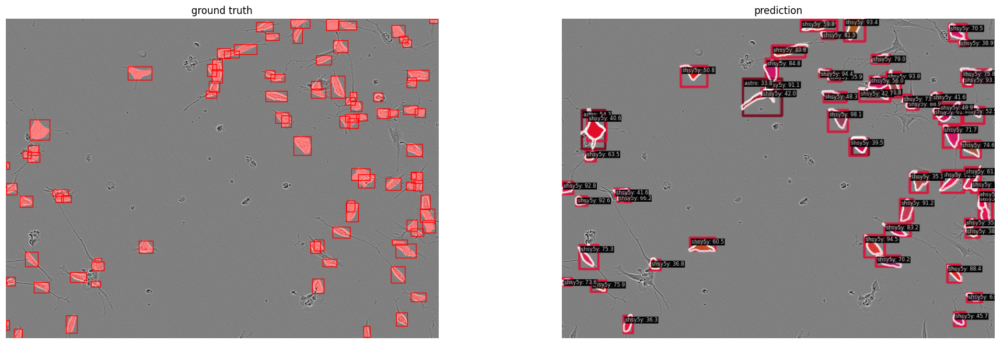

In [ ]:
x = get_top("good", True)
plot_examples(x)

score : 0.05, name : cort, id : e92c56871769


/usr/local/lib/python3.10/dist-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(


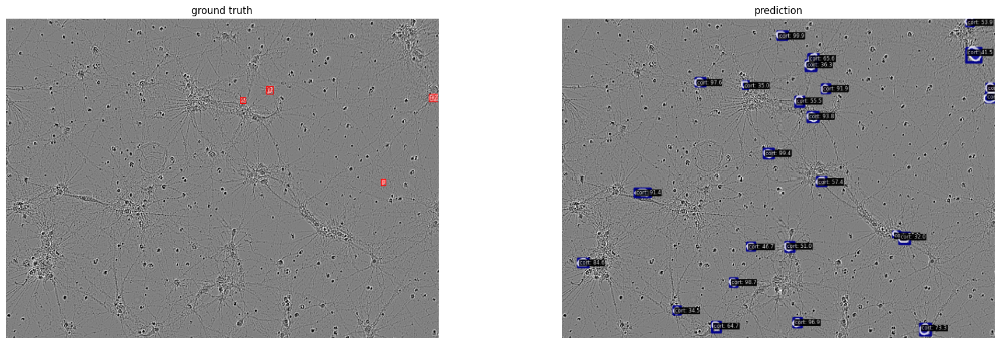

score : 0.066, name : shsy5y, id : 78440cb4b47d


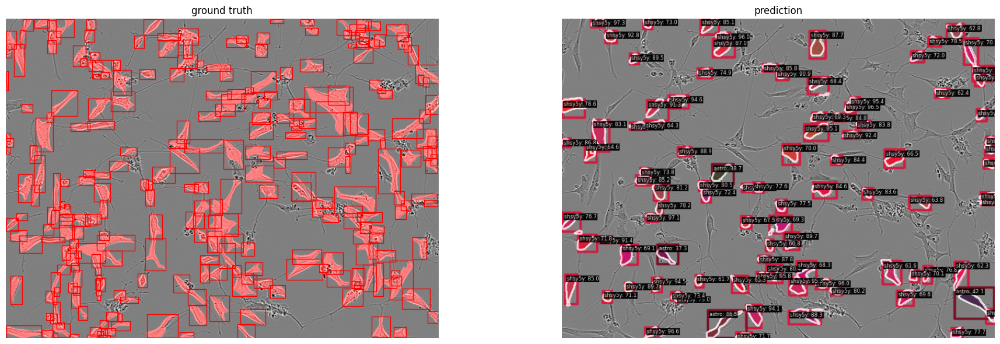

score : 0.084, name : astro, id : cb07e23f138a


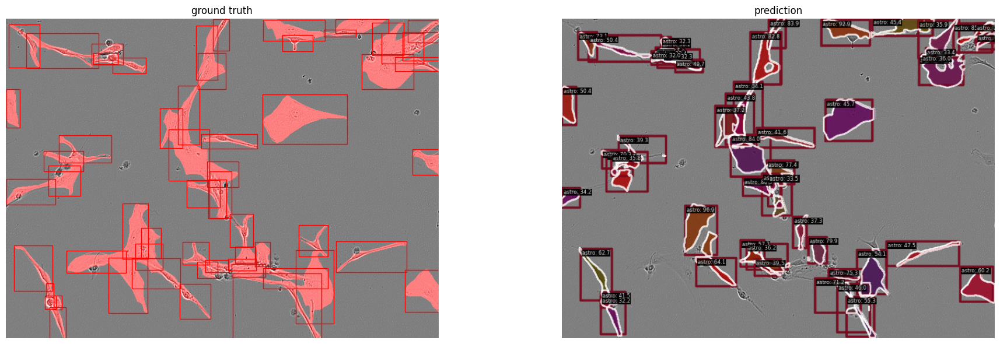

In [ ]:
x = get_top("bad")
plot_examples(x)